<a href="https://colab.research.google.com/github/Iingxaki/DS_Final_Project_RH/blob/main/DS450_EDA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
# prompt: connect to drive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [3]:
# prompt: import the standard libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [14]:
# prompt: read /content/drive/MyDrive/Colab Notebooks/data for DS450.xlsx into df

import pandas as pd
df = pd.read_excel('/content/drive/MyDrive/Colab Notebooks/data for DS450.xlsx')
print(df.head())

  Ticker      Beta  EPS (2019)  ROE (2019)  ROA (2019)  Gross Margin (2019)  \
0   AAPL  0.728095    3.655513    0.610645    0.163230             0.378178   
1   NVDA  2.888390    0.169089    0.443267    0.311541             0.612069   
2   MSFT  1.143125    5.277826    0.383465    0.136937             0.659020   
3   GOOG  0.888521    2.805572    0.170486    0.124472             0.555805   
4  GOOGL  0.888521    2.805572    0.170486    0.124472             0.555805   

   Operating Margin (2019)  Net Profit Margin (2019)  Cash Ratio (2019)  \
0                 0.247342                  0.212381           0.462022   
1                 0.325879                  0.353448           0.588412   
2                 0.340710                  0.311817           0.163584   
3                 0.211001                  0.212181           0.409058   
4                 0.211001                  0.212181           0.409058   

   Current Ratio (2019)  ...  Gross Margin (2023)  Operating Margin (2023)

In [15]:
# prompt: give lit of columns with amount of outliers in that column and % of outliers

import pandas as pd
import numpy as np
def find_outliers(df):
    outlier_summary = []
    for col in df.select_dtypes(include=np.number).columns:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = df[(df[col] < lower_bound) | (df[col] > upper_bound)]
        num_outliers = len(outliers)
        percentage_outliers = (num_outliers / len(df)) * 100 if len(df) > 0 else 0
        outlier_summary.append({
            'column': col,
            'num_outliers': num_outliers,
            'percentage_outliers': f'{percentage_outliers:.2f}%'
        })
    return pd.DataFrame(outlier_summary)
outlier_df = find_outliers(df)
outlier_df


,column,num_outliers,percentage_outliers
0,Beta,16,3.17%
1,EPS (2019),38,7.54%
2,ROE (2019),67,13.29%
3,ROA (2019),29,5.75%
4,Gross Margin (2019),0,0.00%
5,Operating Margin (2019),29,5.75%
6,Net Profit Margin (2019),28,5.56%
7,Cash Ratio (2019),38,7.54%
8,Current Ratio (2019),37,7.34%
9,Quick Ratio (2019),35,6.94%


In [8]:
df.describe()

,Beta,EPS (2019),ROE (2019),ROA (2019),Gross Margin (2019),Operating Margin (2019),Net Profit Margin (2019),Cash Ratio (2019),Current Ratio (2019),Quick Ratio (2019),...,Gross Margin (2023),Operating Margin (2023),Net Profit Margin (2023),Cash Ratio (2023),Current Ratio (2023),Quick Ratio (2023),A-Turnover (2023),I-Turnover (2023),R-Turnover (2023),"% change, Price"
count,503.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,...,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,502.000000,491.000000
mean,0.797630,118.382686,-0.153562,0.067533,0.424493,0.143821,0.112534,0.571659,1.511457,1.141881,...,35.789144,16.426062,13.066706,0.527319,1.404682,0.892780,0.680264,8.436862,11.903914,0.793712
std,0.584612,2523.275699,5.609127,0.079839,0.266557,0.442281,0.411438,1.262977,1.434420,1.157206,...,26.779962,17.497430,17.264114,1.114254,1.480181,1.288385,0.613431,23.766885,28.616814,1.649055
min,-0.393969,-9.604000,-104.043480,-0.363637,0.000000,-9.116667,-8.566667,0.000000,0.000000,0.000000,...,-29.881300,-93.821700,-96.559400,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.841800
25%,0.377332,1.739999,0.076486,0.024370,0.232857,0.081935,0.065771,0.083174,0.768950,0.503162,...,12.362475,8.923800,5.986450,0.055775,0.749650,0.269900,0.301950,0.000000,4.633000,0.063100
50%,0.728988,3.685285,0.143494,0.055565,0.424897,0.149117,0.117623,0.253207,1.212050,0.901789,...,35.311100,16.220200,12.056300,0.228000,1.136750,0.673150,0.540800,2.832150,6.583650,0.422000
75%,1.084444,6.253253,0.254951,0.102909,0.639748,0.220374,0.190601,0.588211,1.827400,1.415405,...,57.851425,24.378550,19.393800,0.578875,1.668925,1.056275,0.824300,5.818025,10.561750,0.993550
max,4.982928,56539.582000,20.230770,0.532833,1.000000,0.876621,0.649807,19.666666,15.330200,13.173799,...,93.116700,101.644300,101.236000,16.337400,19.430600,19.243000,4.744400,268.852500,381.935000,21.838400


<ipython-input-18-fc91b5644703>:10: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  print(corr_matrix.applymap(lambda x: ' ' if pd.notnull(x) else ''))


                    Beta EPS (2019) ROE (2019) ROA (2019) Gross Margin (2019)  \
Beta                                                                            
EPS (2019)                                                                      
ROE (2019)                                                                      
ROA (2019)                                                                      
Gross Margin (2019)                                                             
...                  ...        ...        ...        ...                 ...   
Quick Ratio (2023)                                                              
A-Turnover (2023)                                                               
I-Turnover (2023)                                                               
R-Turnover (2023)                                                               
% change, Price                                                                 

                    Operati

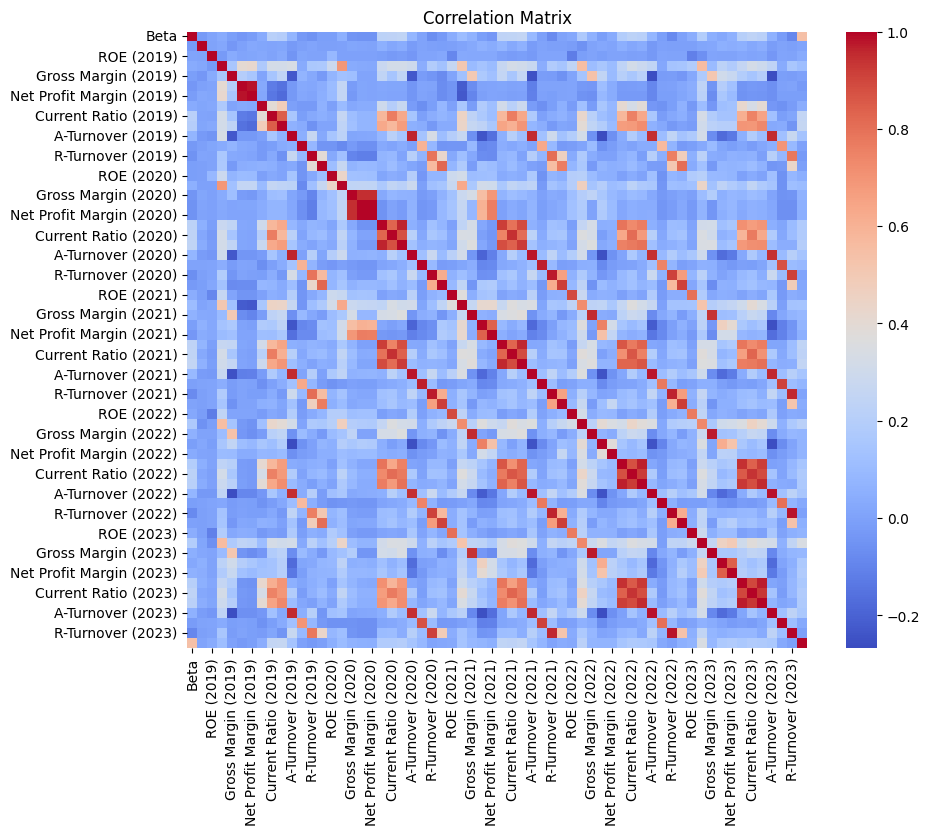

In [18]:
# prompt: corr matrix with everything except the ticker. change entries with words to 0. remove the numbers from the corr matrix# Replace non-numeric values with 0
for col in df.columns:
  if df[col].dtype == 'object':
    df[col] = 0

# Calculate the correlation matrix, excluding the 'Ticker' column
corr_matrix = df.drop(columns=['Ticker']).corr()

# Print the correlation matrix without the numbers
print(corr_matrix.applymap(lambda x: ' ' if pd.notnull(x) else ''))

# Optional: visualize the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=False, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix')
plt.show()


In [21]:
# prompt: clip each column and only accept the 5th till 95th percentile of each column

def clip_percentiles(df):
  clipped_df = df.copy()
  for col in df.select_dtypes(include=np.number).columns:
    lower_percentile = df[col].quantile(0.05)
    upper_percentile = df[col].quantile(0.95)
    clipped_df[col] = np.clip(df[col], lower_percentile, upper_percentile)
  return clipped_df

clipped_df = clip_percentiles(df)
print(clipped_df.head())


   Ticker      Beta  EPS (2019)  ROE (2019)  ROA (2019)  Gross Margin (2019)  \
0       0  0.728095    3.655513    0.610645    0.163230             0.378178   
1       0  1.840082    0.169089    0.443267    0.213504             0.612069   
2       0  1.143125    5.277826    0.383465    0.136937             0.659020   
3       0  0.888521    2.805572    0.170486    0.124472             0.555805   
4       0  0.888521    2.805572    0.170486    0.124472             0.555805   

   Operating Margin (2019)  Net Profit Margin (2019)  Cash Ratio (2019)  \
0                 0.247342                  0.212381           0.462022   
1                 0.325879                  0.353217           0.588412   
2                 0.340710                  0.311817           0.163584   
3                 0.211001                  0.212181           0.409058   
4                 0.211001                  0.212181           0.409058   

   Current Ratio (2019)  ...  Gross Margin (2023)  Operating Margin 

In [24]:
# prompt: drop first row, then put ticker, beta, and % price change column into df named fixed

fixed = clipped_df.iloc[1:, [0, 2, 5]]
fixed.columns = ['ticker', 'beta', '% price change']
print(fixed.head())


   ticker      beta  % price change
1       0  0.169089        0.612069
2       0  5.277826        0.659020
3       0  2.805572        0.555805
4       0  2.805572        0.555805
5       0  1.102045        0.409900


In [22]:
# prompt: group the columns with (2019) in it to df 2019, do the same with (2020), (2021), (2022), (2023)

cdf_2019 = clipped_df.filter(like='(2019)')
df_2019 = df.filter(like='(2019)')
cdf_2020 = clipped_df.filter(like='(2020)')
df_2020 = df.filter(like='(2020)')
cdf_2021 = clipped_df.filter(like='(2021)')
df_2021 = df.filter(like='(2021)')
cdf_2022 = clipped_df.filter(like='(2022)')
df_2022 = df.filter(like='(2022)')
cdf_2023 = clipped_df.filter(like='(2023)')
df_2023 = df.filter(like='(2023)')
print("2019 columns:")
print(df_2019.head())
print("\n2020 columns:")
print(df_2020.head())
print("\n2021 columns:")
print(df_2021.head())
print("\n2022 columns:")
print(df_2022.head())
print("\n2023 columns:")
print(df_2023.head())


2019 columns:
   EPS (2019)  ROE (2019)  ROA (2019)  Gross Margin (2019)  \
0    3.655513    0.610645    0.163230             0.378178   
1    0.169089    0.443267    0.311541             0.612069   
2    5.277826    0.383465    0.136937             0.659020   
3    2.805572    0.170486    0.124472             0.555805   
4    2.805572    0.170486    0.124472             0.555805   

   Operating Margin (2019)  Net Profit Margin (2019)  Cash Ratio (2019)  \
0                 0.247342                  0.212381           0.462022   
1                 0.325879                  0.353448           0.588412   
2                 0.340710                  0.311817           0.163584   
3                 0.211001                  0.212181           0.409058   
4                 0.211001                  0.212181           0.409058   

   Current Ratio (2019)  Quick Ratio (2019)  A-Turnover (2019)  \
0                1.5401            1.501286           0.738878   
1                7.9436       

In [25]:
cdf_2019 = pd.concat([fixed, cdf_2019], axis=1)
cdf_2020 = pd.concat([fixed, cdf_2020], axis=1)
cdf_2021 = pd.concat([fixed, cdf_2021], axis=1)
cdf_2022 = pd.concat([fixed, cdf_2022], axis=1)
cdf_2023 = pd.concat([fixed, cdf_2023], axis=1)
df_2019 = pd.concat([fixed, df_2019], axis=1)
df_2020 = pd.concat([fixed, df_2020], axis=1)
df_2021 = pd.concat([fixed, df_2021], axis=1)
df_2022 = pd.concat([fixed, df_2022], axis=1)
df_2023 = pd.concat([fixed, df_2023], axis=1)

print("\n2019 with fixed:")
print(df_2019.head())
print("\n2020 with fixed:")
print(df_2020.head())
print("\n2021 with fixed:")
print(df_2021.head())
print("\n2022 with fixed:")
print(df_2022.head())
print("\n2023 with fixed:")
print(df_2023.head())



2019 with fixed:
   ticker      beta  % price change  EPS (2019)  ROE (2019)  ROA (2019)  \
1     0.0  0.169089        0.612069    0.169089    0.443267    0.311541   
2     0.0  5.277826        0.659020    5.277826    0.383465    0.136937   
3     0.0  2.805572        0.555805    2.805572    0.170486    0.124472   
4     0.0  2.805572        0.555805    2.805572    0.170486    0.124472   
5     0.0  1.102045        0.409900    1.102045    0.186723    0.051446   

   Gross Margin (2019)  Operating Margin (2019)  Net Profit Margin (2019)  \
1             0.612069                 0.325879                  0.353448   
2             0.659020                 0.340710                  0.311817   
3             0.555805                 0.211001                  0.212181   
4             0.555805                 0.211001                  0.212181   
5             0.409900                 0.051807                  0.041309   

   Cash Ratio (2019)  Current Ratio (2019)  Quick Ratio (2019)  \
1 

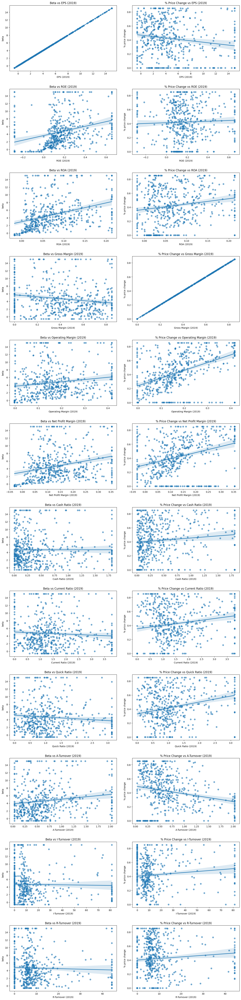

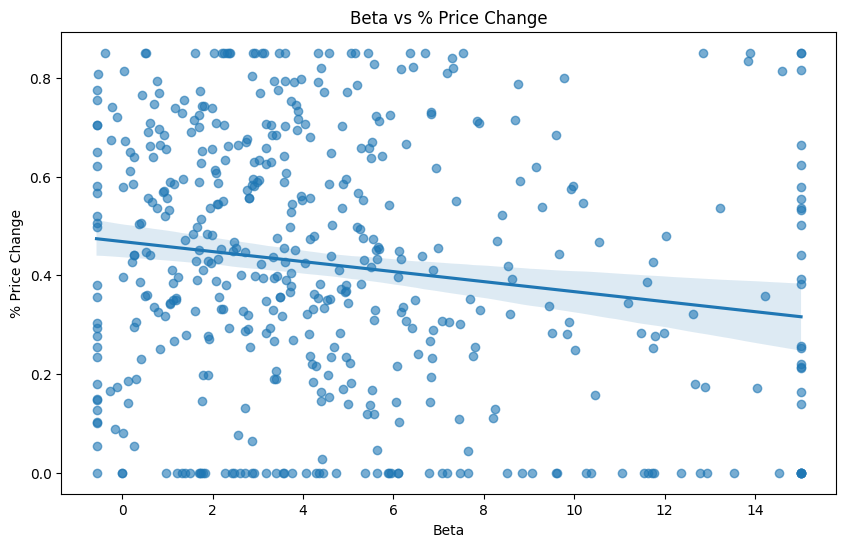

In [ ]:
# prompt: # prompt: for df_2019, graph each of the columns with (2019) in it as the explanatory variable and the beta as the response variable. and then with % price change as the response variable. and then graph beta against % price change include trendline. make the graphs part of grid

import matplotlib.pyplot as plt
fig, axes = plt.subplots(len(df_2019.filter(like='(2019)').columns), 2, figsize=(15, 5 * len(df_2019.filter(like='(2019)').columns)))

for i, col in enumerate(df_2019.filter(like='(2019)').columns):
    # Graph with Beta
    sns.regplot(x=df_2019[col], y=df_2019['beta'], ax=axes[i, 0], scatter_kws={'alpha':0.6})
    axes[i, 0].set_title(f'Beta vs {col}')

    # Graph with % Price Change
    sns.regplot(x=df_2019[col], y=df_2019['% price change'], ax=axes[i, 1], scatter_kws={'alpha':0.6})
    axes[i, 1].set_title(f'% Price Change vs {col}')

fig.tight_layout(pad=3.0)
plt.show()

plt.figure(figsize=(10, 6))
sns.regplot(x=df_2019['beta'], y=df_2019['% price change'], scatter_kws={'alpha':0.6})
plt.title('Beta vs % Price Change')
plt.xlabel('Beta')
plt.ylabel('% Price Change')
plt.show()


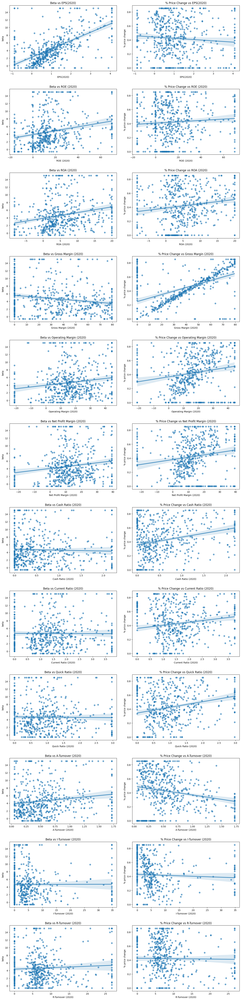

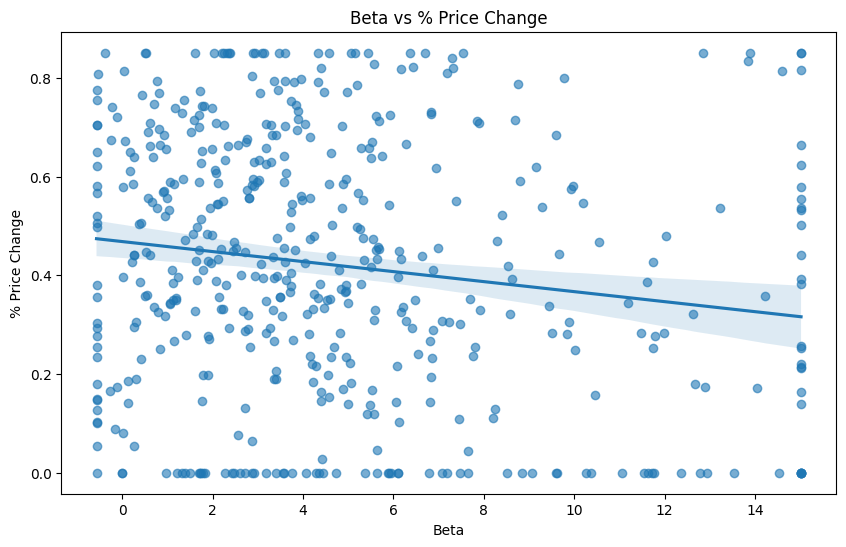

In [ ]:
# prompt: # prompt: for df_2020, graph each of the columns with (2020) in it as the explanatory variable and the beta as the response variable. and then with % price change as the response variable. and then graph beta against % price change include trendline. make the graphs part of grid

import matplotlib.pyplot as plt
fig, axes = plt.subplots(len(df_2020.filter(like='(2020)').columns), 2, figsize=(15, 5 * len(df_2020.filter(like='(2020)').columns)))

for i, col in enumerate(df_2020.filter(like='(2020)').columns):
    # Graph with Beta
    sns.regplot(x=df_2020[col], y=df_2020['beta'], ax=axes[i, 0], scatter_kws={'alpha':0.6})
    axes[i, 0].set_title(f'Beta vs {col}')

    # Graph with % Price Change
    sns.regplot(x=df_2020[col], y=df_2020['% price change'], ax=axes[i, 1], scatter_kws={'alpha':0.6})
    axes[i, 1].set_title(f'% Price Change vs {col}')

fig.tight_layout(pad=3.0)
plt.show()

plt.figure(figsize=(10, 6))
sns.regplot(x=df_2020['beta'], y=df_2020['% price change'], scatter_kws={'alpha':0.6})
plt.title('Beta vs % Price Change')
plt.xlabel('Beta')
plt.ylabel('% Price Change')
plt.show()


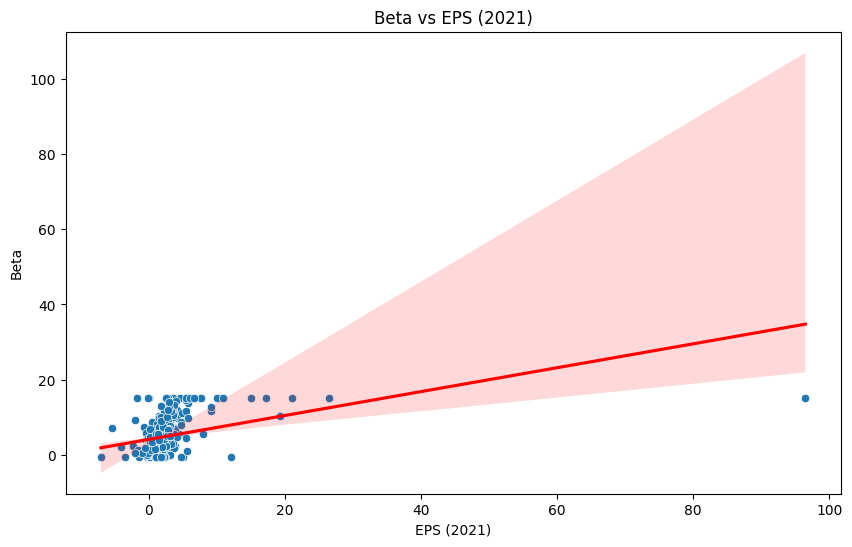

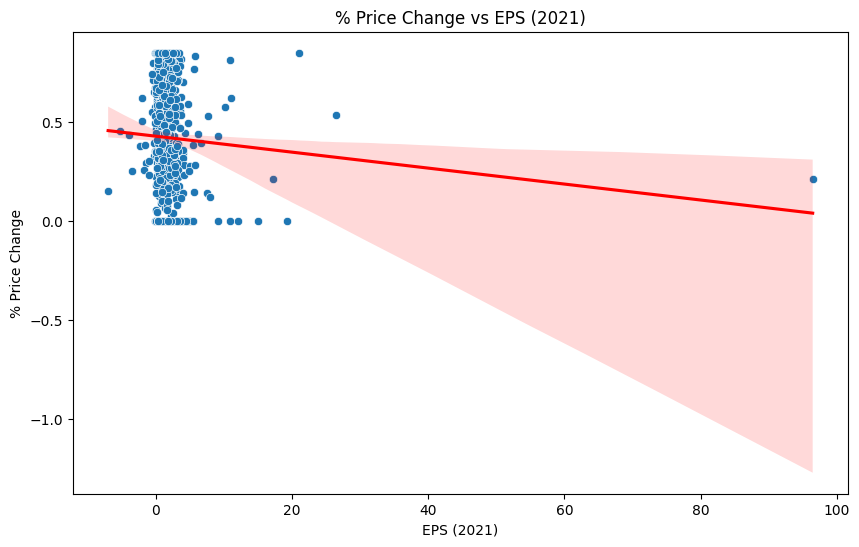

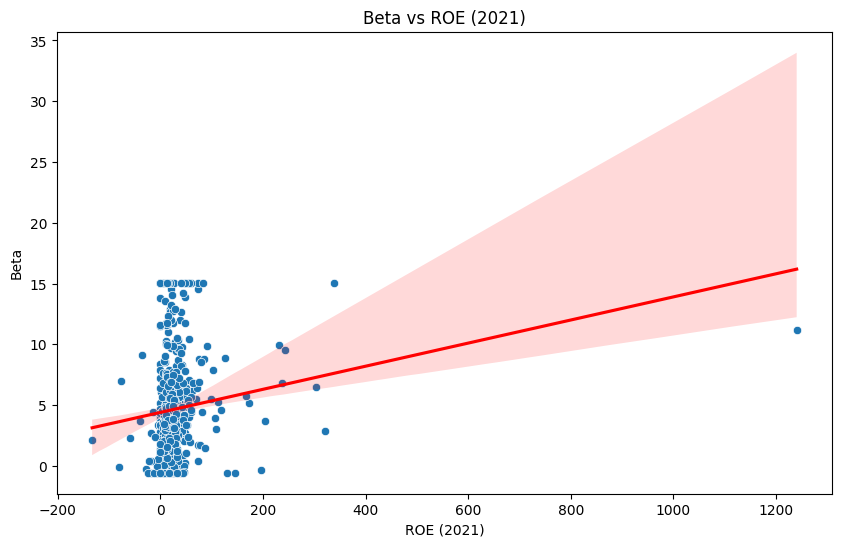

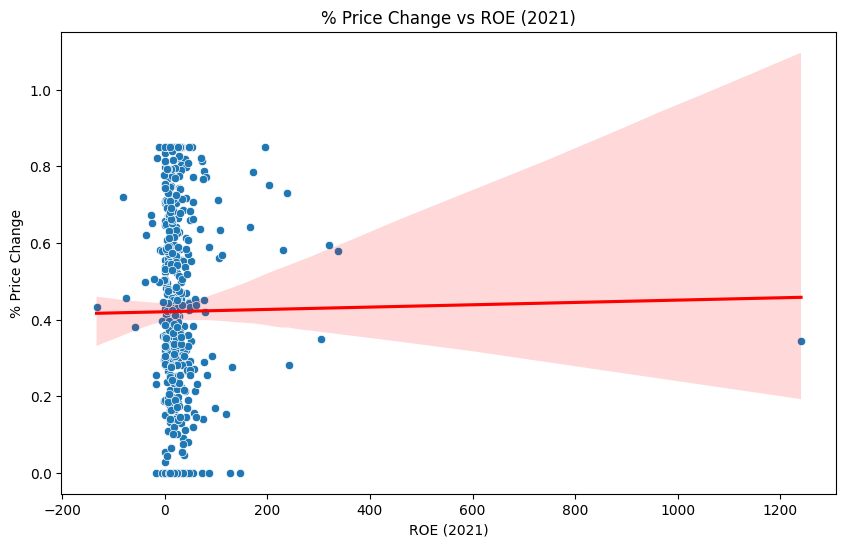

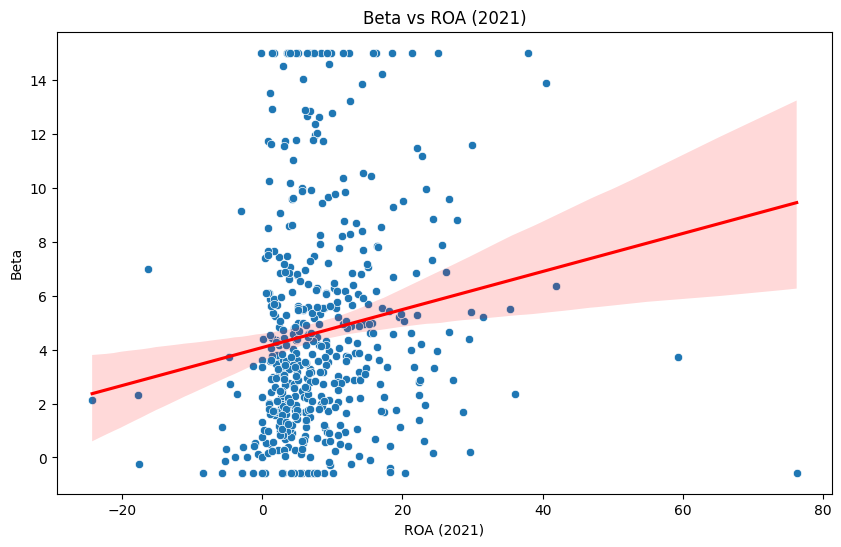

...

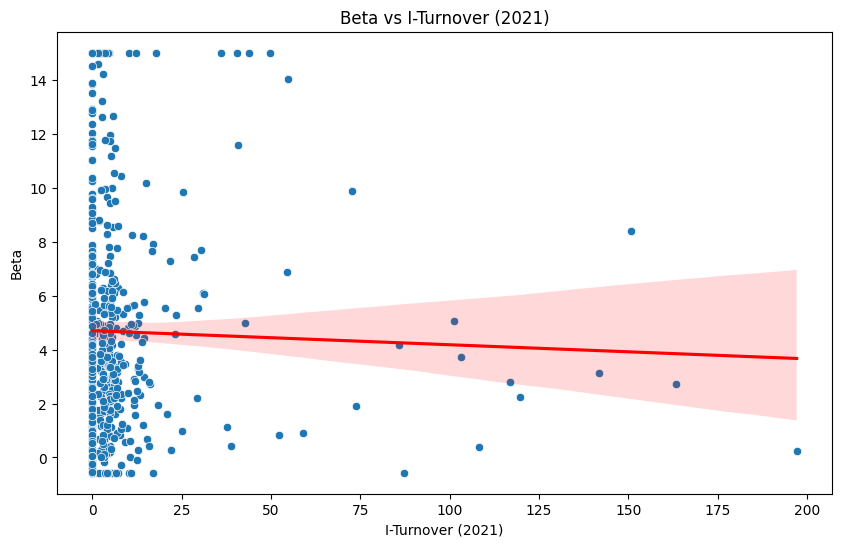

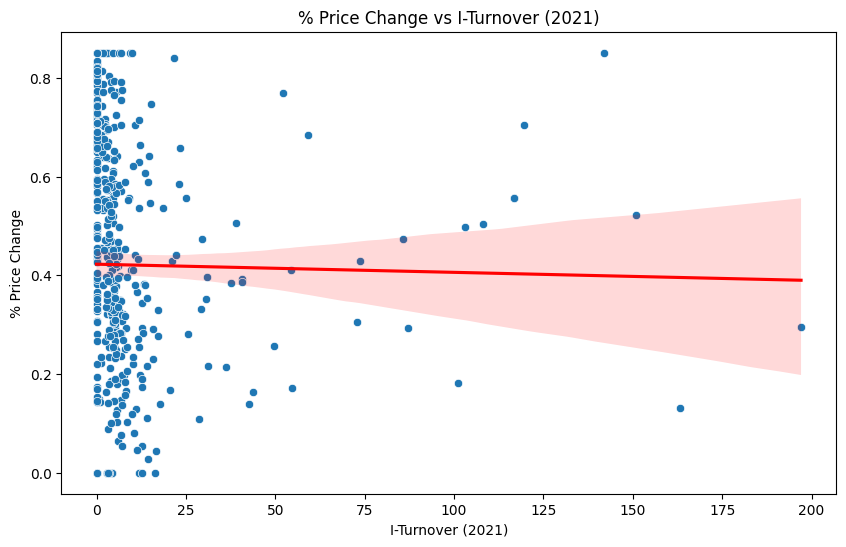

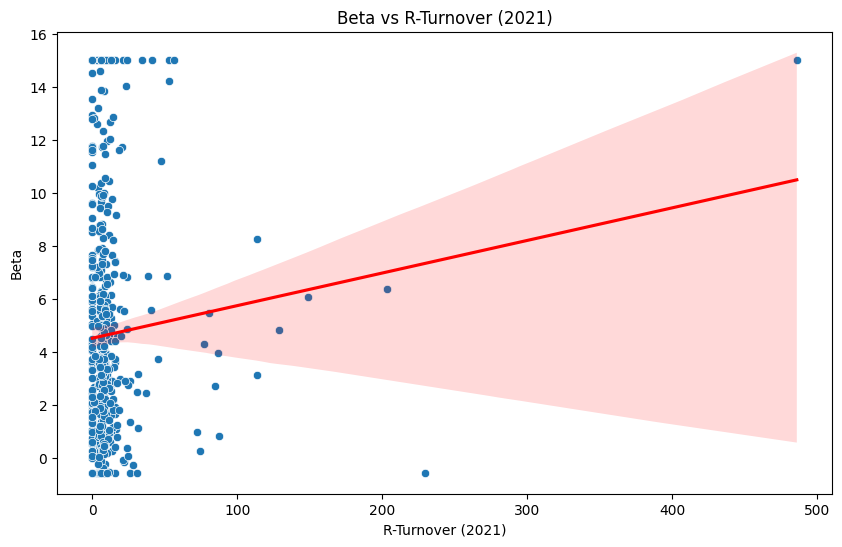

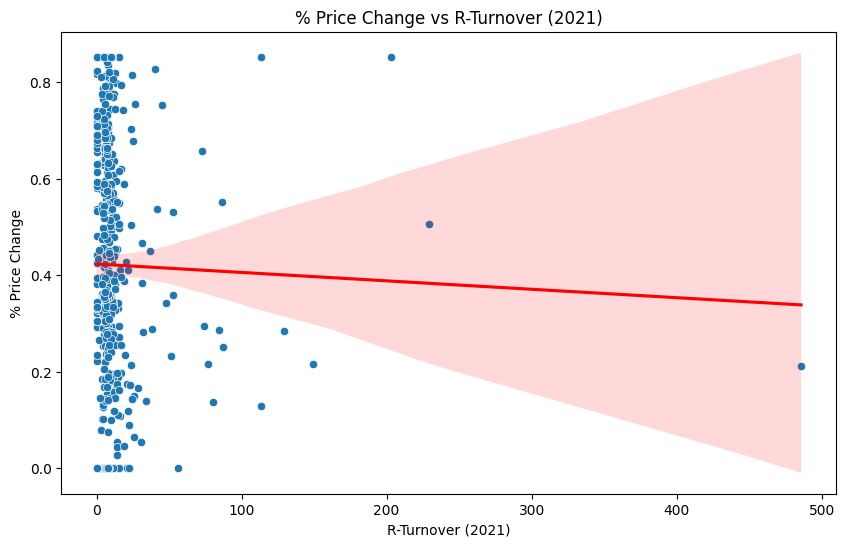

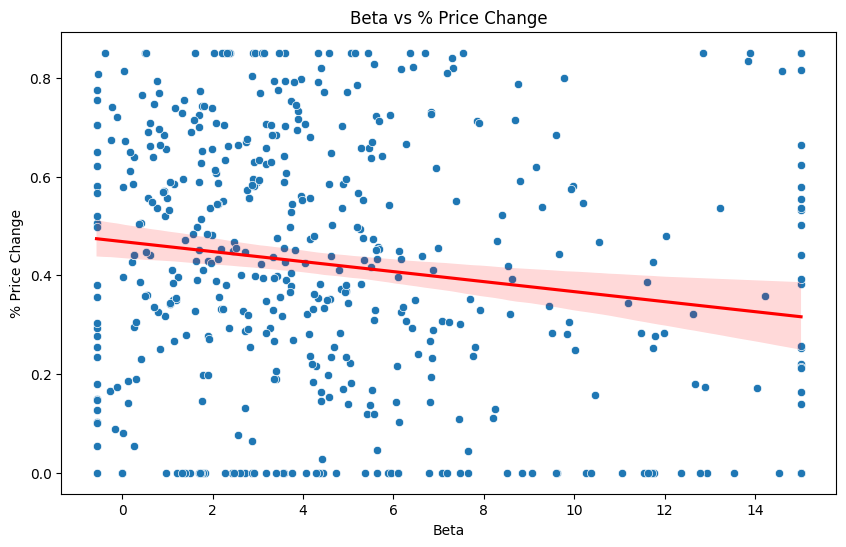

In [26]:
# prompt: for df_2021, graph each of the columns with (2021) in it as the explanatory variable and the beta as the response variable. and then with % price change as the response variable. and then graph beta against % price change. give trendline

import matplotlib.pyplot as plt
for col in df_2021.columns:
  if '(2021)' in col:
    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df_2021[col], y=df_2021['beta'])
    sns.regplot(x=df_2021[col], y=df_2021['beta'], scatter=False, color='red')
    plt.title(f'Beta vs {col}')
    plt.xlabel(col)
    plt.ylabel('Beta')
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.scatterplot(x=df_2021[col], y=df_2021['% price change'])
    sns.regplot(x=df_2021[col], y=df_2021['% price change'], scatter=False, color='red')
    plt.title(f'% Price Change vs {col}')
    plt.xlabel(col)
    plt.ylabel('% Price Change')
    plt.show()

plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_2021['beta'], y=df_2021['% price change'])
sns.regplot(x=df_2021['beta'], y=df_2021['% price change'], scatter=False, color='red')
plt.title('Beta vs % Price Change')
plt.xlabel('Beta')
plt.ylabel('% Price Change')
plt.show()


In [38]:
# prompt: corr of cdf_2019,cdf_2020,cdf_2021,cdf_2022,cdf_2023 df_2019,df_2020,df_2021,df_2022, df_2023. don't concat. drop Ticker. just print the corr of each column to beta and % price change. if abs(corr coefficient) >.25 mark *, if >.5 mark **, if >.75 mark ***. output in table format for each year. and print the ones marked and by what at the end
years = [2019, 2020, 2021, 2022, 2023]
cdf_dfs = [cdf_2019, cdf_2020, cdf_2021, cdf_2022, cdf_2023]
df_dfs = [df_2019, df_2020, df_2021, df_2022, df_2023]
marked_correlations = {}

for year, cdf_df, df_df in zip(years, cdf_dfs, df_dfs):
    print(f"Year: {year}")

    year_marked_correlations = {}
    results = []

    for col in df_df.filter(like=f'({year})').columns:
      corr_beta = df_df['beta'].corr(df_df[col])
      corr_price_change = df_df['% price change'].corr(df_df[col])

      beta_mark = ''
      price_change_mark = ''

      if abs(corr_beta) > 0.75:
          beta_mark = '***'
      elif abs(corr_beta) > 0.5:
          beta_mark = '**'
      elif abs(corr_beta) > 0.25:
          beta_mark = '*'

      if abs(corr_price_change) > 0.75:
          price_change_mark = '***'
      elif abs(corr_price_change) > 0.5:
          price_change_mark = '**'
      elif abs(corr_price_change) > 0.25:
          price_change_mark = '*'

      results.append({
        'column': col,
        'corr_beta': f'{corr_beta:.2f} {beta_mark}',
        'corr_%_price_change': f'{corr_price_change:.2f} {price_change_mark}'
      })

      if beta_mark or price_change_mark:
        year_marked_correlations[col] = {
            'beta': beta_mark,
            'price_change': price_change_mark
        }

    print(pd.DataFrame(results))
    print("\n")
    marked_correlations[year] = year_marked_correlations

print("Marked Correlations:")
for year, corr_dict in marked_correlations.items():
    if corr_dict:
        print(f"Year: {year}")
        for col, marks in corr_dict.items():
            beta_mark = marks['beta']
            price_change_mark = marks['price_change']

            if beta_mark and price_change_mark:
                print(f"  Column: {col}, Beta: {beta_mark}, Price Change: {price_change_mark}")
            elif beta_mark:
               print(f"  Column: {col}, Beta: {beta_mark}")
            elif price_change_mark:
                print(f"  Column: {col}, Price Change: {price_change_mark}")


Year: 2019
                      column corr_beta corr_%_price_change
0                 EPS (2019)     0.12               -0.03 
1                 ROE (2019)     0.01                0.03 
2                 ROA (2019)    0.38 *               0.15 
3        Gross Margin (2019)    -0.16             1.00 ***
4    Operating Margin (2019)     0.12                0.20 
5   Net Profit Margin (2019)     0.15                0.15 
6          Cash Ratio (2019)     0.08               -0.00 
7       Current Ratio (2019)    -0.03                0.14 
8         Quick Ratio (2019)    -0.06                0.23 
9          A-Turnover (2019)     0.14               -0.23 
10         I-Turnover (2019)    -0.05                0.07 
11         R-Turnover (2019)     0.02                0.03 


Year: 2020
                      column corr_beta corr_%_price_change
0                  EPS(2020)    0.36 *              -0.03 
1                 ROE (2020)     0.18                0.07 
2                 ROA (2020)    

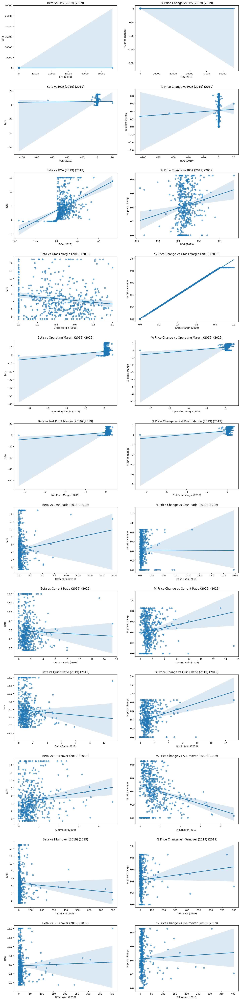

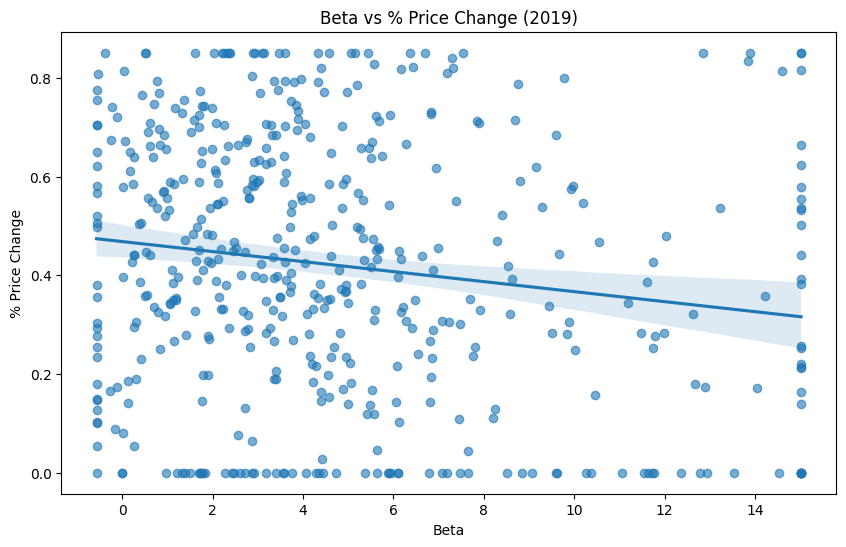

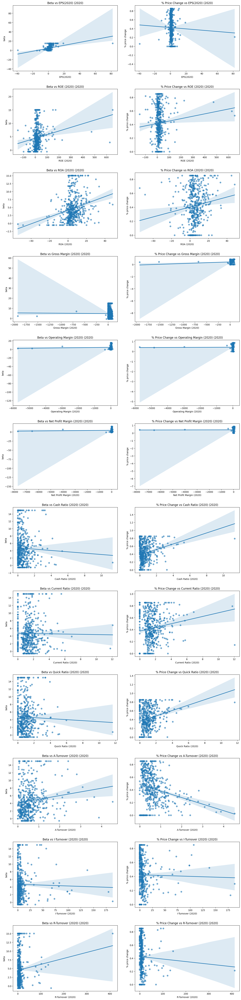

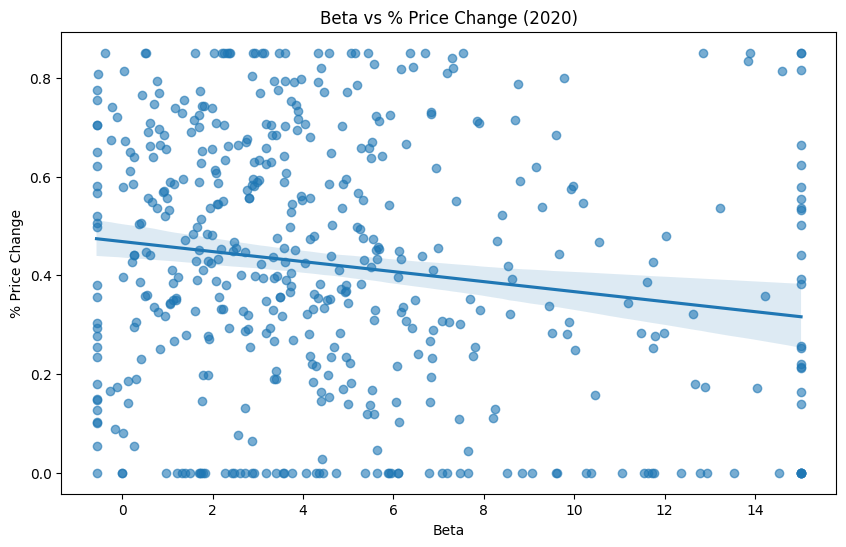

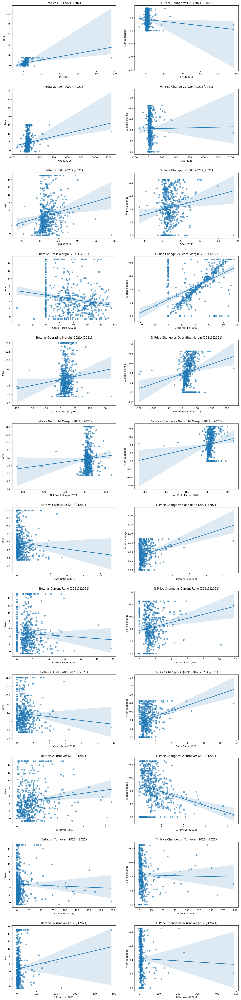

...

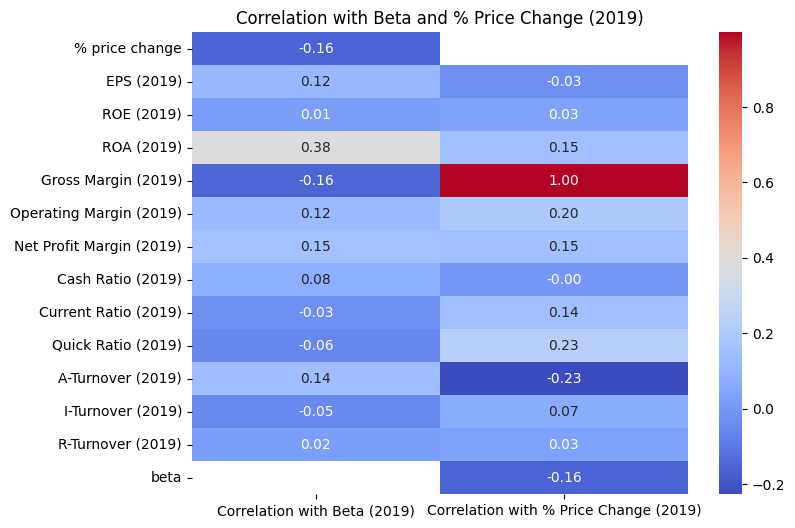

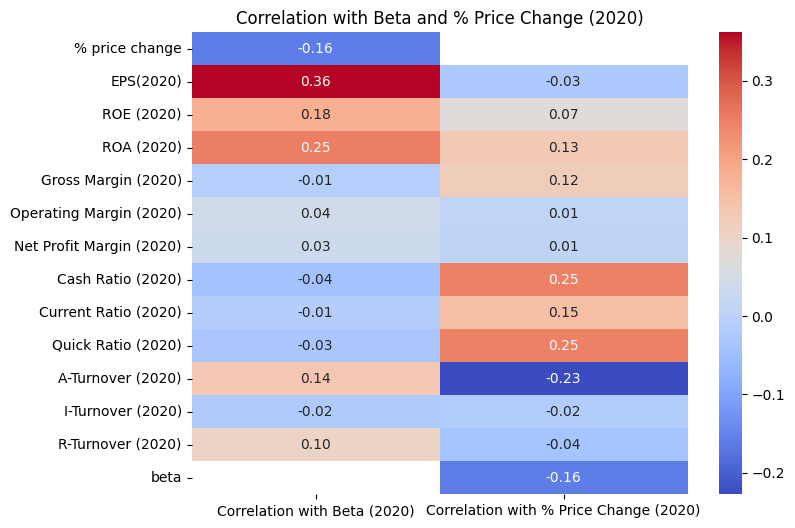

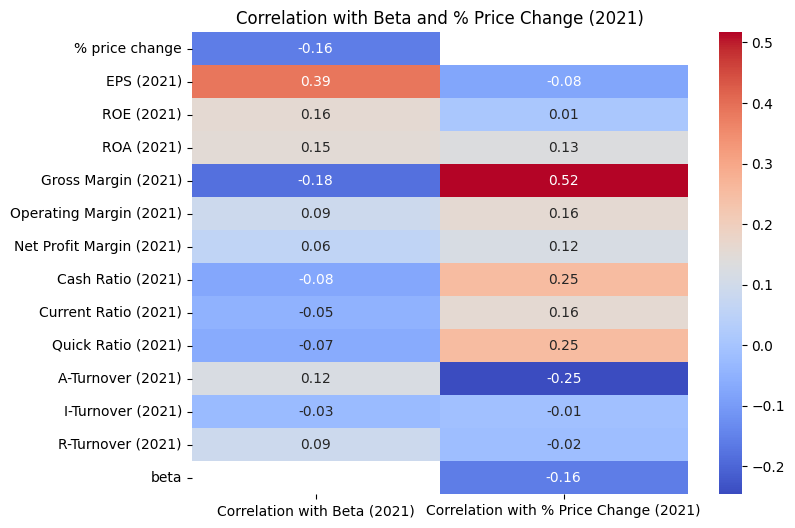

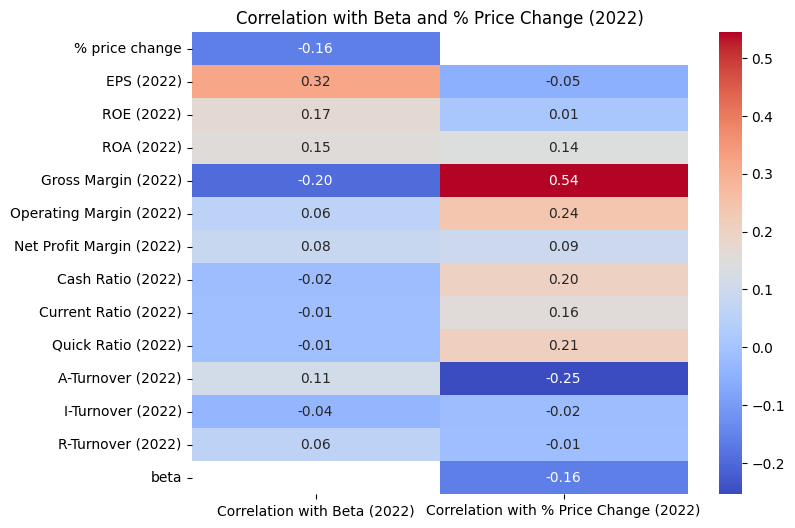

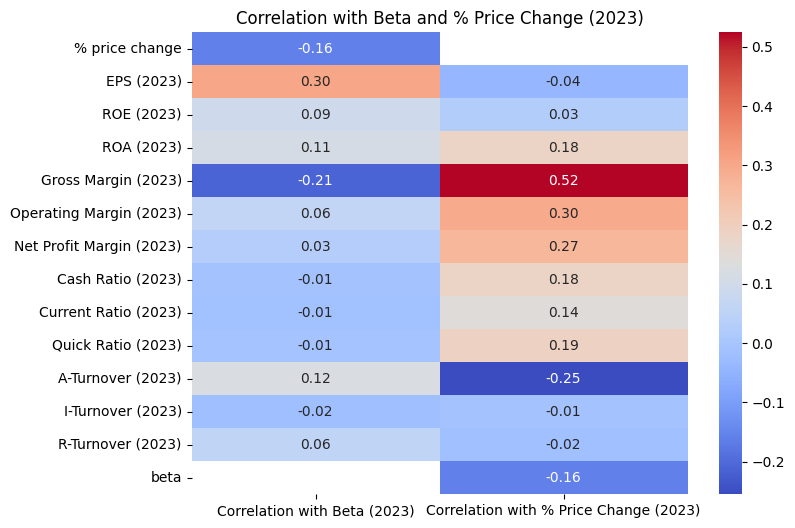

In [32]:
# prompt: corr_matrix of cdf_2019,cdf_2020,cdf_2021,cdf_2022,cdf_2023 df_2019,df_2020,df_2021,df_2022, df_2023. don't concat. put the graphs in a grid. only drop ticker. also, just show the correlation of each column to beta and % price change in a heatmap

def plot_correlations(df, year):
    num_cols = len(df.filter(like=f'({year})').columns)
    fig, axes = plt.subplots(num_cols, 2, figsize=(15, 5 * num_cols))
    if num_cols == 1:
      axes = axes.reshape(1,2) #handles case when there's only one plot


    for i, col in enumerate(df.filter(like=f'({year})').columns):
        sns.regplot(x=df[col], y=df['beta'], ax=axes[i, 0], scatter_kws={'alpha': 0.6})
        axes[i, 0].set_title(f'Beta vs {col} ({year})')

        sns.regplot(x=df[col], y=df['% price change'], ax=axes[i, 1], scatter_kws={'alpha': 0.6})
        axes[i, 1].set_title(f'% Price Change vs {col} ({year})')

    fig.tight_layout(pad=3.0)
    plt.show()

    plt.figure(figsize=(10, 6))
    sns.regplot(x=df['beta'], y=df['% price change'], scatter_kws={'alpha':0.6})
    plt.title(f'Beta vs % Price Change ({year})')
    plt.xlabel('Beta')
    plt.ylabel('% Price Change')
    plt.show()

plot_correlations(df_2019, 2019)
plot_correlations(df_2020, 2020)
plot_correlations(df_2021, 2021)
plot_correlations(df_2022, 2022)
plot_correlations(df_2023, 2023)


def plot_heatmap(df, year):
  corr_matrix = df.drop(columns=['ticker']).corr()

  beta_corr = corr_matrix[['beta']].drop('beta').rename(columns={'beta': f'Correlation with Beta ({year})'})
  price_corr = corr_matrix[['% price change']].drop('% price change').rename(columns={'% price change': f'Correlation with % Price Change ({year})'})

  combined_corr = pd.concat([beta_corr, price_corr], axis=1)

  plt.figure(figsize=(8, 6))
  sns.heatmap(combined_corr, annot=True, cmap='coolwarm', fmt=".2f")
  plt.title(f'Correlation with Beta and % Price Change ({year})')
  plt.show()

plot_heatmap(df_2019, 2019)
plot_heatmap(df_2020, 2020)
plot_heatmap(df_2021, 2021)
plot_heatmap(df_2022, 2022)
plot_heatmap(df_2023, 2023)


In [44]:
# prompt: drop Ticker column run mlr using % price change on the response variable and the rest of the columns as the explanatory variable with each of the years' df's

import statsmodels.api as sm

def run_mlr(df, year):
    df_year = df.copy()
    # Prepare data for regression
    X = df_year.filter(like=f'({year})').copy()
    y = df_year['% price change'].copy()

    # Add a constant to the model (intercept)
    X = sm.add_constant(X)

    # Fit the model
    model = sm.OLS(y, X, missing='drop') # 'drop' handles NAs
    results = model.fit()

    # Print the results
    print(f"MLR Results for {year}:\n")
    print(results.summary())
    return results

mlr_results = {}
for year, df_df in zip(years, df_dfs):
  mlr_results[year] = run_mlr(df_df, year)


MLR Results for 2019:

                            OLS Regression Results                            
Dep. Variable:         % price change   R-squared:                       0.996
Model:                            OLS   Adj. R-squared:                  0.996
Method:                 Least Squares   F-statistic:                 1.098e+04
Date:                Wed, 05 Feb 2025   Prob (F-statistic):               0.00
Time:                        15:22:14   Log-Likelihood:                 1366.4
No. Observations:                 501   AIC:                            -2707.
Df Residuals:                     488   BIC:                            -2652.
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                               coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------
c

In [45]:
# prompt: drop Ticker column run mlr using % price change on the response variable and the rest of the columns as the explanatory variable with each of the years' df's. print each year's explanatory variables that has P>|t| <.1 and its coefcient and the ones that has P>|t|<.05 and their coefficient. Last, rank the years by their adjusted R

import pandas as pd
import statsmodels.api as sm

years = [2019, 2020, 2021, 2022, 2023]
df_dfs = [df_2019, df_2020, df_2021, df_2022, df_2023]
r_squared_values = []


for year, df_year in zip(years, df_dfs):
    print(f"Year: {year}")

    # Drop 'ticker' column
    df_year = df_year.drop(columns=['ticker'], errors='ignore')

    # Prepare explanatory variables and response variable
    explanatory_vars = df_year.filter(like=f'({year})').columns.tolist()
    response_var = '% price change'

    # Add constant to the explanatory variables
    X = sm.add_constant(df_year[explanatory_vars])
    y = df_year[response_var]

    # Fit the multiple linear regression model
    model = sm.OLS(y, X, missing='drop').fit() # 'drop' handles NAs
    # Get significant variables based on p-values
    significant_vars_10 = model.pvalues[model.pvalues < 0.1].drop('const')
    significant_vars_05 = model.pvalues[model.pvalues < 0.05].drop('const')

    print("Variables with P>|t| < 0.1:")
    for var, p_val in significant_vars_10.items():
        print(f"  {var}: Coefficient = {model.params[var]:.4f}, P-value = {p_val:.4f}")

    print("\nVariables with P>|t| < 0.05:")
    for var, p_val in significant_vars_05.items():
         print(f"  {var}: Coefficient = {model.params[var]:.4f}, P-value = {p_val:.4f}")

    print("\n")

    r_squared_values.append({
        'year': year,
        'adjusted_r_squared': model.rsquared_adj
    })

# Rank years by adjusted R-squared
r_squared_df = pd.DataFrame(r_squared_values)
ranked_years = r_squared_df.sort_values(by='adjusted_r_squared', ascending=False)
print("Years ranked by adjusted R-squared:")
ranked_years


Year: 2019
Variables with P>|t| < 0.1:
  Gross Margin (2019): Coefficient = 0.9760, P-value = 0.0000
  Cash Ratio (2019): Coefficient = -0.0020, P-value = 0.0032

Variables with P>|t| < 0.05:
  Gross Margin (2019): Coefficient = 0.9760, P-value = 0.0000
  Cash Ratio (2019): Coefficient = -0.0020, P-value = 0.0032


Year: 2020
Variables with P>|t| < 0.1:
  EPS(2020): Coefficient = -0.0054, P-value = 0.0624
  ROA (2020): Coefficient = 0.0042, P-value = 0.0021
  Gross Margin (2020): Coefficient = 0.0021, P-value = 0.0000
  Net Profit Margin (2020): Coefficient = -0.0013, P-value = 0.0560
  Current Ratio (2020): Coefficient = -0.0419, P-value = 0.0143
  Quick Ratio (2020): Coefficient = 0.1147, P-value = 0.0169
  A-Turnover (2020): Coefficient = -0.1349, P-value = 0.0000

Variables with P>|t| < 0.05:
  ROA (2020): Coefficient = 0.0042, P-value = 0.0021
  Gross Margin (2020): Coefficient = 0.0021, P-value = 0.0000
  Current Ratio (2020): Coefficient = -0.0419, P-value = 0.0143
  Quick Ratio

,year,adjusted_r_squared
0,2019,0.996220
3,2022,0.367828
4,2023,0.350413
2,2021,0.331874
1,2020,0.241247
